In [1]:
import pandas as pd

In [2]:
import matplotlib.pyplot as plt

In [3]:
import seaborn as sns

In [4]:
import plotly.express as px

In [5]:
import plotly.graph_objects as go

## Датасет с данными о домах в Калифорнии:

In [6]:
df = pd.read_csv('../datasets/housing.csv')
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


**Имея в фрейме данные о координатах, можем построить целую карту:**

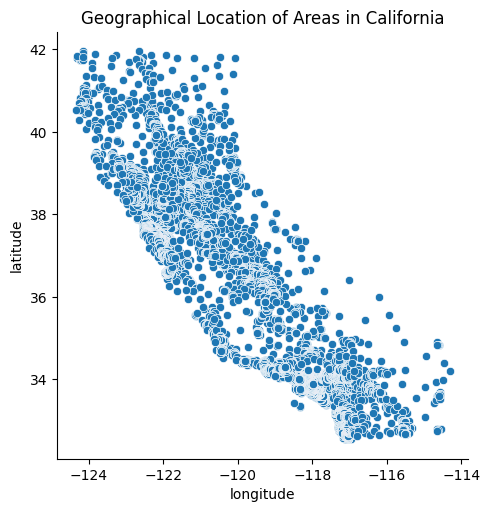

In [7]:
g = sns.relplot(kind='scatter', data=df, x='longitude', y='latitude') # relplot - визуализирует взаимосвязь переменных
g.set(title='Geographical Location of Areas in California')

**Наглядно посмотрим удалённость домов от побережья, для этого добавим цвет:**

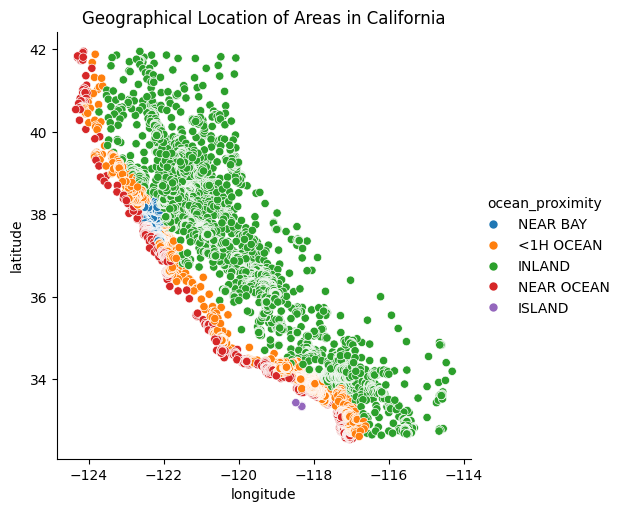

In [8]:
g = sns.relplot(kind='scatter', data=df, x='longitude', y='latitude', hue='ocean_proximity')
g.set(title='Geographical Location of Areas in California')

**Здесь: всё что красным - побережье, есть острова - фиолетовый, также можно заметить синие точки - залив(бухта)**

**Теперь добавим ещё несколько типов точек, чтобы, как бы, классифицировать одну точку по нескольким параметрам:**

In [9]:
df['above_median_house_value'] = (df.median_house_value > df.median_house_value.median()).astype(int)
df # введём дополнительный параметр, который будет делить данные по средней стоимости дома(больше и меньше медианы)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,above_median_house_value
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,1
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,1
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,1
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,1
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,1
...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND,0
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND,0
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND,0
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND,0


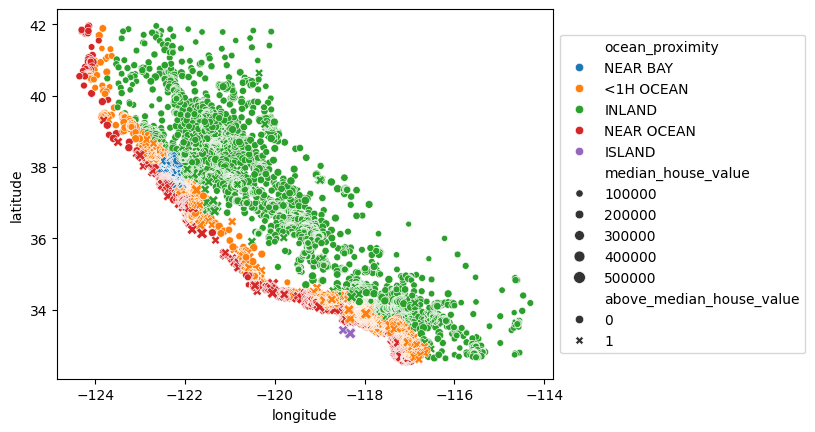

In [10]:
g = sns.scatterplot(data=df, x='longitude', y='latitude',
                style='above_median_house_value',
                hue='ocean_proximity',
                size='median_house_value')
g.legend(loc='center left', bbox_to_anchor=(1, 0.5)) # легенда перекрывала пол графика(

**Теперь:**
* Удалённость от побережья - цвет
* Стоимость дома дороже или дешевле медианы - крестики и точки(соответственно)
* Количество домов выделяется размером (от меньшего к большему)

*Один из выводов: большинство домов на побережье и, тем более, островах - дороже, чем дома внутри материка, хотя и там можно заметить пару дорогих районов*
<br>*P.S. на северном побережье дома подешевле*

**Посмотрим на распределение количества комнат в зависимости от приближённости к океану:**

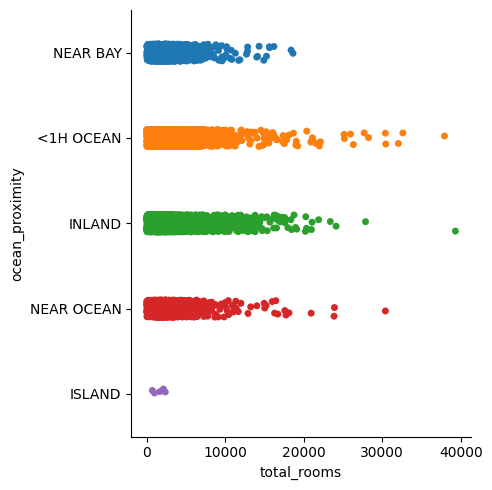

In [11]:
sns.catplot(x='total_rooms', y='ocean_proximity', hue='ocean_proximity', data=df)

**Логичный вывод: на островах особо не расстроишься :)**

* *в районе залива тоже не так много комнат(что имеет смысл, ведь сама область "залив" не такая большая, как например "inland")*

**Но лучше построим "ящики"(кажется, что коробка звучит лучше..)**

<Axes: xlabel='median_house_value', ylabel='ocean_proximity'>

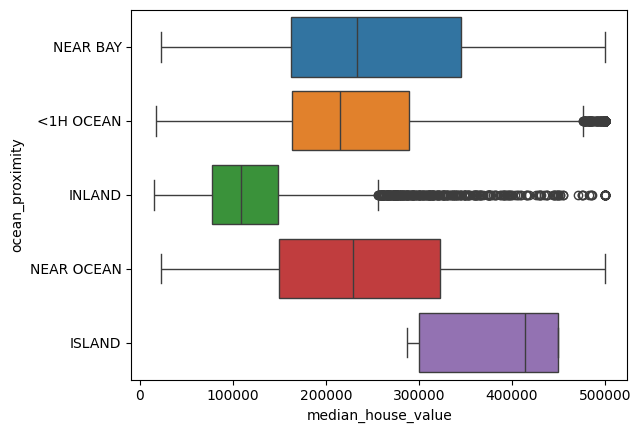

In [12]:
sns.boxplot(x='median_house_value', y='ocean_proximity', hue='ocean_proximity', data=df)

* На осровах в целом не так много домов и строительство там тоже дорогое, судя по всему, поэтому у нас такой, относительно, *небольшой разброс и высокая стартовая цена, даже минимальная выше 250.000*
* Вблизи океана, цены имеют приблизительный разброс от 150 до 300 тыс, однако минимальная и максимальная цена почти полностью охватывают шкалу.
* Внутри материка, большинство домов имеют наименьшую среднюю цену из всех в этой выборке, однако имеется большое количество выбросов в зоне с дорогими домами, видимо это супер особняки в горах, которые *нецелесообразно строить на побережье ввиду цены за землю*.
* Подтверждая один из выводов выше, хорошее решение взять дом в часе от океана. Отличное отношение цена/комфорт. В среднем дома здесь дешевле, чем на побережье, хотя и 25 процентиль выше. Также присутствует часть выбросов, *наверное это беверли или голивуд)*
* В заливе, видимо, живут люди, которые по какой-то причине не захотели жить на побережье океана, но решили всё-таки жить у воды, за это они заплатят в среднем больше чем ребята с побережья. *(Вспомнив географию, подтвердилась догадка, что здесь айтишный Сан-Франциско со своей Кремниевой Долиной, теперь понятно почему этот район даже дороже побережья тихого)*

**Разделим это на дешёвые и дорогие дома по медиане:**

<Axes: xlabel='median_house_value', ylabel='ocean_proximity'>

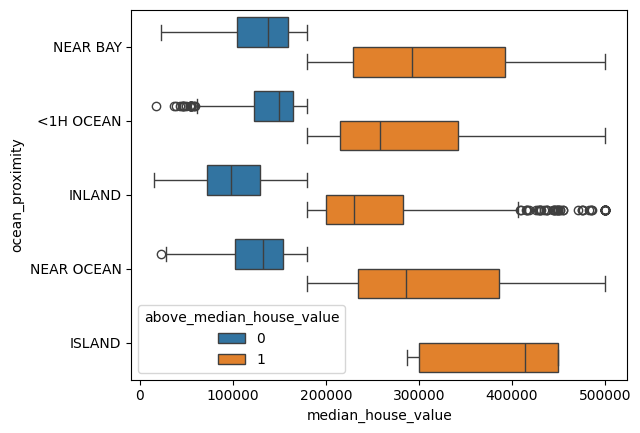

In [13]:
sns.boxplot(x='median_house_value', y='ocean_proximity', 
            hue='above_median_house_value', data=df)

* Опять же, дешевле всего селиться внутри материка
* А в часе от побережья можно попробовать урвать "дорогой" дом подешёвке. (Кстати на побережье "дешёвые" дома, в среднем, дешевле, чем в часе от него)
* Острова, как не крути, всё равно дорого.

**Посмотрим на время застройки:**

<Axes: xlabel='housing_median_age', ylabel='ocean_proximity'>

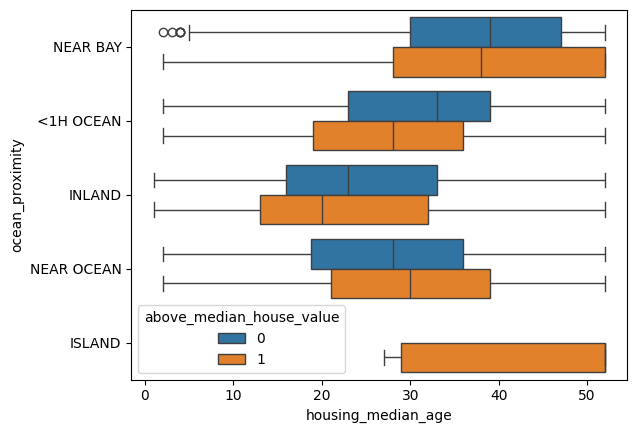

In [14]:
sns.boxplot(x='housing_median_age', y='ocean_proximity', 
            hue='above_median_house_value', data=df)

* Внутри материка более современное жильё.
* На островах, как и в СФ, наиболее старые постройки.
* Прибрежные районы застраивались почти одновременно. Современные дорогие дома дешевле в удалении от побережья, а дешёвые новостройки дешевле на побережье.
* Во всех категориях, кроме островов, есть только, что построенные дома, на островах же минимальный возраст дома - 27 лет.

**А вот ещё одна интересная статистика, сколько домовладельцы зарабатывают и в каких районах:**

<Axes: xlabel='ocean_proximity', ylabel='median_income'>

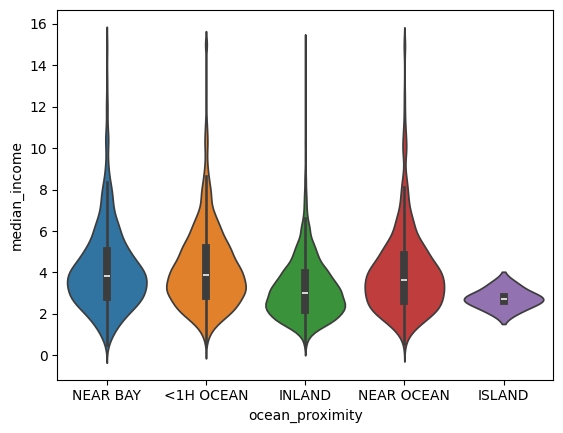

In [15]:
sns.violinplot(y="median_income", x="ocean_proximity", hue='ocean_proximity', data=df)

*вообще выводов особо тут не сделать, потому что данные собирались по блокам(районам), поэтому это среднее среднего.*

* На островах доход около 30 тысяч, при этом их дома одни из самых дорогих.
* Домовладельцы из СФ и прибрежных районов зарабатывают примерно одинаково, однако, кажется, что на побережье у людей "вилка" шире.
* Большая часть людей из "глубинки" имеют доход ниже, чем остальные(справедливости, они и платят меньше)

**Немного plotly:**

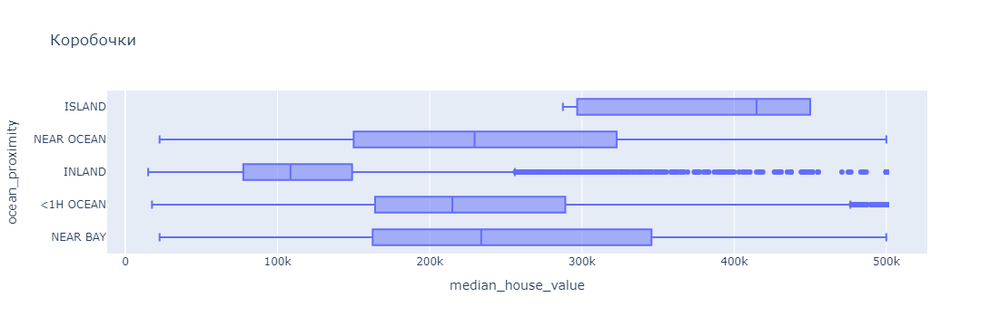

In [16]:
px.box(df,
       x='median_house_value',
       y='ocean_proximity',
       title='Коробочки',
       hover_data=['median_income']
       )

**разделим данные на категории**

In [17]:
bins = [0, 100, 200, 300, 400, 500]
labels = ["0-100", "100-200", "200-300", "300-400", "400-500"]


df["house_value_category"] = pd.cut(df["median_house_value"], bins=bins, labels=labels, right=False)

In [18]:
fig = px.violin(
    df, 
    x="house_value_category",  # Категориальная переменная
    y="median_income",  # Числовая переменная
    box=True,  # Добавить "ящик с усами"
    title="Распределение дохода к стоимости собственности",
    hover_data=['ocean_proximity'],
    category_orders={"house_value_category": ["0-100", "100-200", "200-300", "300-400", "400-500"]}
)
fig.show()

* Для каждой категории существуют свои выбросы(причём в верхних точках)
* В целом с увеличением дохода, люди владеют всё большей собственностью(что тоже логично)

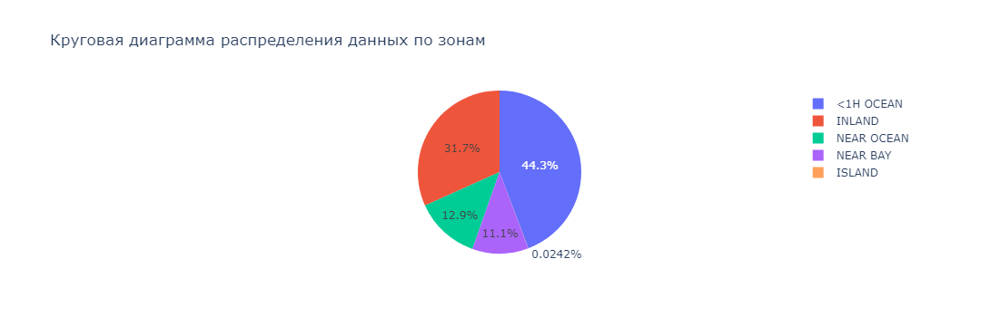

In [19]:
px.pie(df, names='ocean_proximity', title='Круговая диаграмма распределения данных по зонам')

*Получим круговую диаграмму распределения данных по зонам*

* Большинство данных из датасета собрано для районов в часе от побережья

## Датасет с данными о погоде:

In [20]:
from copy import deepcopy

In [23]:
weather_df = pd.read_csv('../datasets/jena_climate_2009_2016.csv')
weather_df

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.30,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.40,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.90,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.20,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.10,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420546,31.12.2016 23:20:00,1000.07,-4.05,269.10,-8.13,73.10,4.52,3.30,1.22,2.06,3.30,1292.98,0.67,1.52,240.0
420547,31.12.2016 23:30:00,999.93,-3.35,269.81,-8.06,69.71,4.77,3.32,1.44,2.07,3.32,1289.44,1.14,1.92,234.3
420548,31.12.2016 23:40:00,999.82,-3.16,270.01,-8.21,67.91,4.84,3.28,1.55,2.05,3.28,1288.39,1.08,2.00,215.2
420549,31.12.2016 23:50:00,999.81,-4.23,268.94,-8.53,71.80,4.46,3.20,1.26,1.99,3.20,1293.56,1.49,2.16,225.8


**Сократим временные интервалы так, чтобы осталось только температура в полдень:**

In [24]:
weather_df = weather_df[71::6*24][:365]
weather_df.reset_index(drop=True, inplace=True)

weather_df_full = deepcopy(weather_df) # оставили копию со всеми столбцами

weather_df = weather_df[['Date Time', 'p (mbar)', 'T (degC)']]

weather_df

,Date Time,p (mbar),T (degC)
0,01.01.2009 12:00:00,1000.30,-6.87
1,02.01.2009 12:00:00,998.91,-3.12
2,03.01.2009 12:00:00,999.02,-5.96
3,04.01.2009 12:00:00,988.94,-1.21
4,05.01.2009 12:00:00,990.42,-3.65
...,...,...,...
360,27.12.2009 12:20:00,979.12,0.48
361,28.12.2009 12:20:00,977.18,2.88
362,29.12.2009 12:20:00,979.23,-1.77
363,30.12.2009 12:20:00,968.20,4.70


*Почему-то всё равно съехало, но мы в рамках полудня*

In [25]:
weather_df['Date Time']

0      01.01.2009 12:00:00
1      02.01.2009 12:00:00
2      03.01.2009 12:00:00
3      04.01.2009 12:00:00
4      05.01.2009 12:00:00
              ...         
360    27.12.2009 12:20:00
361    28.12.2009 12:20:00
362    29.12.2009 12:20:00
363    30.12.2009 12:20:00
364    31.12.2009 12:20:00
Name: Date Time, Length: 365, dtype: object

**Преобразуем столбец из объекта в тип дата:**

In [26]:
weather_df['Date Time'] = pd.to_datetime(weather_df['Date Time'], format='%d.%m.%Y %H:%M:%S')
weather_df['Date Time']

0     2009-01-01 12:00:00
1     2009-01-02 12:00:00
2     2009-01-03 12:00:00
3     2009-01-04 12:00:00
4     2009-01-05 12:00:00
              ...        
360   2009-12-27 12:20:00
361   2009-12-28 12:20:00
362   2009-12-29 12:20:00
363   2009-12-30 12:20:00
364   2009-12-31 12:20:00
Name: Date Time, Length: 365, dtype: datetime64[ns]

**Построим линейный график изменения температуры за год:**

<Axes: xlabel='Date Time', ylabel='T (degC)'>

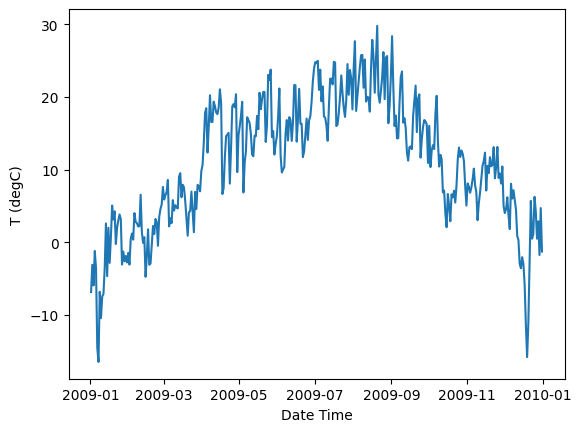

In [27]:
sns.lineplot(x='Date Time', y='T (degC)', data=weather_df)
# g.figure.autofmt_xdate() # - чтобы точки на графике шли по времени вне зависимости от данных в таблице(например если там всё перемешено)

**Plotly даст возможность посмотреть точные значения:**

In [28]:
from plotly.subplots import make_subplots

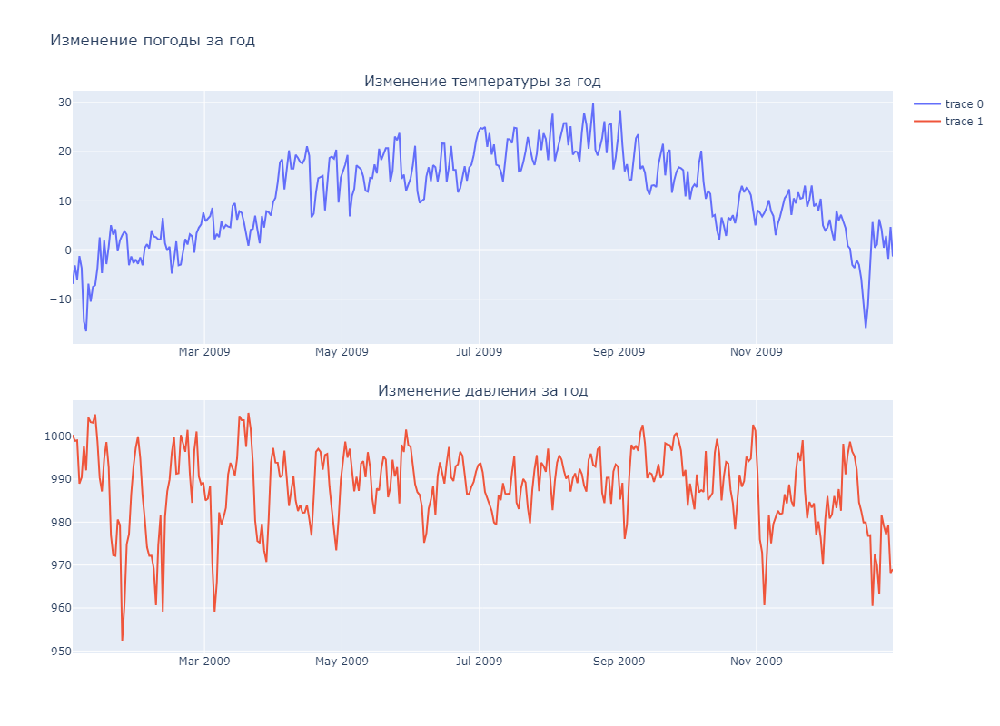

In [29]:
fig = make_subplots(rows=2, cols=1,
                    subplot_titles=("Изменение температуры за год", "Изменение давления за год"),
                    vertical_spacing=0.1)

fig.add_trace(go.Scatter(
    x=weather_df['Date Time'],
    y=weather_df['T (degC)'],
    mode='lines'),
    row=1, col=1
)

fig.add_trace(go.Scatter(
    x=weather_df['Date Time'],
    y=weather_df['p (mbar)'],
    mode='lines'),
    row=2, col=1
)

fig.update_layout(title="Изменение погоды за год",
                 height=800)

fig.show()

*Теперь можно наводить и смотреть на значение:*

## Тот самый Титаник:

In [30]:
titanic = sns.load_dataset('titanic')
titanic

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,0,13.0000,S,Second,man,True,NaN,Southampton,no,True
887,1,1,female,19.0,0,0,30.0000,S,First,woman,False,B,Southampton,yes,True
888,0,3,female,NaN,1,2,23.4500,S,Third,woman,False,NaN,Southampton,no,False
889,1,1,male,26.0,0,0,30.0000,C,First,man,True,C,Cherbourg,yes,True


**Построим график распределения возраста, измерим количество в процентах, а также разделим данные по полу**

<Axes: xlabel='age', ylabel='Percent'>

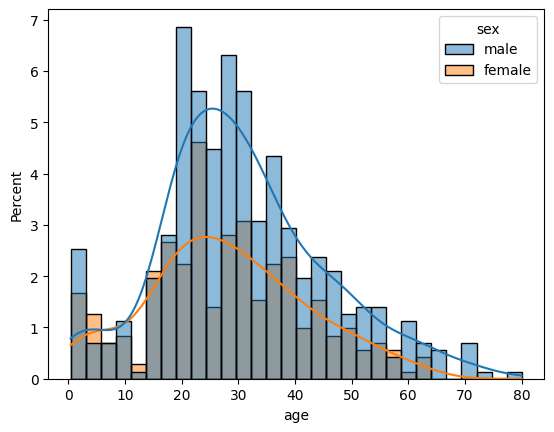

In [31]:
sns.histplot(data=titanic, x='age', bins=30, kde=True, stat='percent', hue='sex')

*добавили сюда вероятность нахождения человека на титанике по возрасту*

* Больше мужчин, чем женщин, но среди подростков больше женщин.
* Большинство пассажиров в возрасте от 20 до 40 лет
* Есть, относительно, большое количество новорождённых детей на коробле
* Пожилых людей меньше остальных

**Посмотрим зависимость выживания от принадлежности к полу:**

<Axes: xlabel='sex', ylabel='survived'>

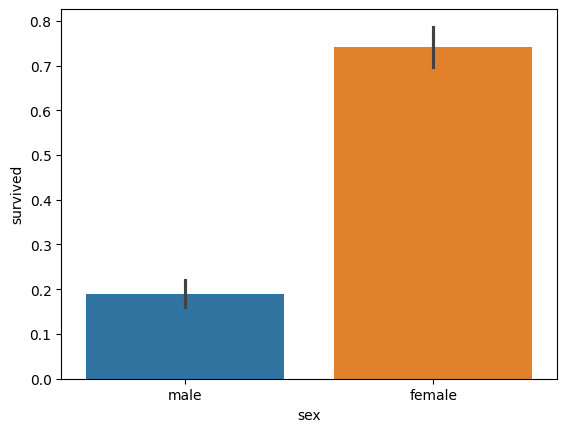

In [32]:
sns.barplot(y='survived', x='sex', hue='sex', data=titanic)

*у женщины вероятность выжить почти 80%, в то время как у мужчины меньше 20%*

<Axes: xlabel='sex', ylabel='survived'>

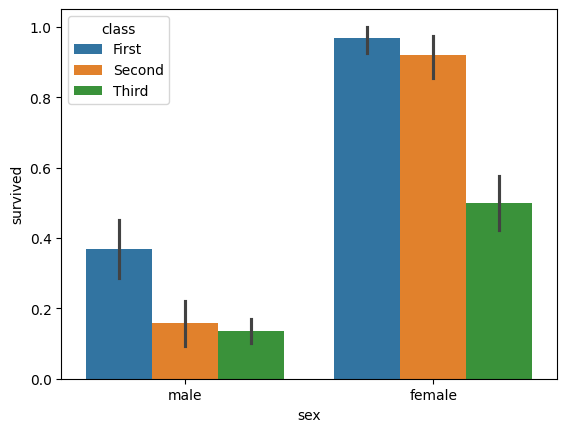

In [33]:
sns.barplot(y='survived', x='sex', hue='class', data=titanic)

* Закономерно у людей из первого класса, выше шанс на выживание, однако даже при этом, женщина из третьего класса спасётся с большей вероятностью, чем мужчина из первого.
* Судя по всему, сначала спасали женщин всех классов, а следом мужчин из первого класса и далее по остаточному принципу.